# Processing Data


In [1]:
# ruff: noqa: E402

%load_ext autoreload
%autoreload 2

# find the root of the project
import os
from pathlib import Path
import sys
import polars as pl
import dotenv


ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
sys.path.append(str(ROOT))


dotenv.load_dotenv(ROOT.joinpath(".env"))

from src.utils import check_gpu_available

GPU = check_gpu_available()
print(f"GPU available: {GPU}")

/home/max/Development/roadside-radar/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU available: True


## Load the Network


In [2]:
import geopandas as gpd
from src.geometry import RoadNetwork


mainline_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=["EBL1", "WBL1"],
    step_size=0.01,
)

full_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=None,
    step_size=0.01,
)

LANE_WIDTH = 3.55
LANE_NUM = 2

## Read in the Trajectories


In [3]:
from datetime import timedelta
import polars as pl
from src.radar import CalibratedRadar
from src.pipelines.open_file import prep_df


USE_FRONT = False


radar_obj = CalibratedRadar(
    radar_location_path=ROOT / "configuration" / "october_calibrated.yaml",
)


radar_df = (
    pl.scan_parquet(
        Path(os.environ.get("RAW_DATA_DIR")).joinpath("*.parquet"),
    )
    .with_columns(
        pl.col("epoch_time").dt.replace_time_zone("UTC"),
    )
    .filter(pl.col("epoch_time").dt.month() == 10)
    .filter(
        pl.col("epoch_time").is_between(
            pl.lit("2023-10-31 11:40:00")
            .str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            )
            .dt.convert_time_zone("UTC"),
            pl.lit("2023-10-31 13:00:00")
            .str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            )
            .dt.convert_time_zone("UTC"),
        )
    )
    .with_columns(
        (pl.col("f32_positionX_m") ** 2 + pl.col("f32_positionY_m") ** 2)
        .sqrt()
        .alias("dist"),
    )
    .filter(
        pl.when(pl.col("ip").is_in(["10.160.7.141", "10.160.7.137"]))
        .then(pl.col("dist") < 250)
        .otherwise(pl.lit(True))
    )
    # mark whether approaching or receding
    .collect()
    .lazy()
    .pipe(prep_df, f=radar_obj)
    .pipe(
        mainline_net.map_to_lane,
        dist_upper_bound=LANE_WIDTH * LANE_NUM
        - (LANE_WIDTH / 2)
        + 0.5,  # centered on one of the lanes,
        utm_x_col="utm_x",
        utm_y_col="utm_y",
    )
    .filter(pl.col("name").is_not_null())
    .rename(
        {
            "name": "lane",
            "angle": "heading_lane",
        }
    )
    .with_columns(
        (pl.col("dist").diff().backward_fill(1).over("object_id") < 0).alias(
            "approaching"
        )
    )
)

function: create_object_id took: 0.0002522468566894531 seconds
function: filter_short_trajectories took: 0.00033164024353027344 seconds
function: clip_trajectory_end took: 0.00022339820861816406 seconds
function: resample took: 0.00022554397583007812 seconds
function: fix_duplicate_positions took: 0.00015306472778320312 seconds
function: set_timezone took: 4.076957702636719e-05 seconds
function: add_cst_timezone took: 2.765655517578125e-05 seconds
function: add_heading took: 2.9087066650390625e-05 seconds
function: rotate_radars took: 0.0004906654357910156 seconds
function: update_origin took: 0.0004668235778808594 seconds


In [4]:
from src.pipelines.kalman_filter import (
    prepare_frenet_measurement,
    build_extension,
    add_timedelta,
    build_kalman_id,
    filter_short_trajectories,
)


prediction_length = 4

radar_df = (
    radar_df.pipe(
        filter_short_trajectories, minimum_distance_m=5, minimum_duration_s=2
    )
    .pipe(prepare_frenet_measurement)
    .pipe(build_extension, seconds=prediction_length)
    .pipe(add_timedelta)
    .pipe(build_kalman_id, split_time_delta=0.2)
    .collect()
)

function: filter_short_trajectories took: 0.2064988613128662 seconds
function: prepare_frenet_measurement took: 0.00044989585876464844 seconds
function: build_extension took: 1.308518409729004 seconds
function: add_timedelta took: 0.0003299713134765625 seconds
function: build_kalman_id took: 0.00039196014404296875 seconds


In [5]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     radar_df
#     .with_columns((pl.col("s") + pl.col('distanceToFront_s')).alias("s"))
#     .pipe(radar_obj.add_cst_timezone)
#     .filter(
#     #     pl.col("epoch_time_cst").is_between(
#     #         pl.lit("2023-03-13 06:50:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #         pl.lit("2023-03-13 06:59:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #     )
#         (pl.col("lane").str.contains("E"))
#         # & (pl.col("lane_index") == 0)
#     )
#     .with_columns(
#         (pl.col('s').max() - pl.col('s')).alias('s'),
#     )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

In [6]:
# radar_df[["s", "s_velocity", "d", "d_velocity"]].describe()

In [7]:
from src.pipelines.kalman_filter import build_kalman_df

filter_df = (
    radar_df
    # .with_columns((pl.col("distanceToFront_s") + pl.col("s")).alias("front_s"))
    .pipe(build_kalman_df, s_col="front_s" if USE_FRONT else "s")
    .filter(
        pl.col("max_time") < pl.col("max_time").max()  # filter out the outlier times
    )
    .collect()
)

function: build_kalman_df took: 0.0008399486541748047 seconds


### IMM Filter the Radar Trajectories


In [8]:
filter_df.group_by("vehicle_ind").agg(pl.col("time_ind").max())["time_ind"].describe()

statistic,value
str,f64
"""count""",17145.0
"""null_count""",0.0
"""mean""",142.788276
"""std""",74.875505
"""min""",39.0
"""25%""",100.0
"""50%""",130.0
"""75%""",164.0
"""max""",889.0


In [9]:
from src.filters.vectorized_kalman import batch_imm_df
import numpy as np

filt_df = batch_imm_df(
    filter_df.rename({"measurement": "z"}),
    filters=("CALC", "CALK", "CVLK"),
    M=np.array([[0.9, 0.05, 0.05], [0.05, 0.9, 0.05], [0.05, 0.05, 0.9]]),
    mu=np.array([0.1, 0.1, 0.8]),
    # chunk_size=3_500,
    chunk_size=800 if not GPU else 15_000,
    gpu=GPU,
)

100%|██████████| 2/2 [00:26<00:00, 13.16s/it]


In [10]:
from src.pipelines.kalman_filter import join_results

joined_df = join_results(filt_df, filter_df, radar_df)

if USE_FRONT:
    joined_df = joined_df.rename({"s": "front_s"})

joined_df = joined_df.collect()

function: join_results took: 0.0008566379547119141 seconds


### Tuning the IMM Filter Noise Parameters

In [11]:
# from src.filters.fusion import mahalanobis_distance
# from scipy.stats import chi2

# target = chi2.ppf(0.95, 4)


# test_df = (
#     joined_df.lazy()
#     .with_columns(
#         pl.col(
#             "s",
#             "s_velocity",
#             "d",
#             "d_velocity",
#         )
#         .shift(1)
#         .backward_fill(1)
#         .over("object_id")
#         .name.map(lambda x: x + "_leader"),
#         pl.col("P")
#         .cast(pl.List(inner=pl.Float32))
#         .shift(1)
#         .backward_fill(1)
#         .over("object_id")
#         .cast(joined_df["P"].dtype)
#         .name.map(lambda x: x + "_leader"),
#     )
#     .collect()
#     .pipe(
#         mahalanobis_distance,
#         return_maha=True,
#         pos_override=["s"],
#         gpu=GPU,
#     )
# ).select(["m_sq"])

In [12]:
# (test_df['m_sq'] < target).sum() / len(test_df)

## Plotting the Lanes


In [13]:
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(10, 5))

# joined_df.filter(pl.col("lane").str.contains("W") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

# ax.set_xlim(-5, 6)

(-5.0, 6.0)

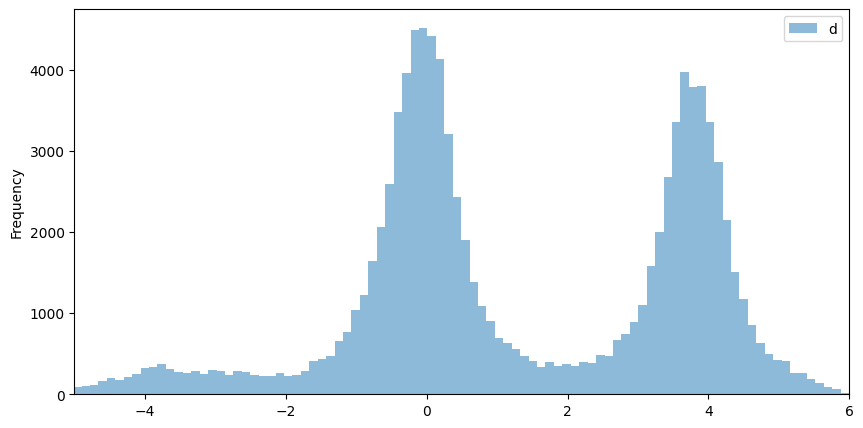

In [14]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

joined_df.filter(pl.col("lane").str.contains("E") & pl.col("d").is_between(-6, 6))[
    ["d"]
].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

ax.set_xlim(-5, 6)

### Classify the Lanes


In [15]:
from src.pipelines.lane_classification import label_lane, label_lanes_tree
from src.gmm.lane_classification import build_lane_model
from src.plotting.lane_gmm import plot_model

In [16]:
res = joined_df.pipe(
    label_lanes_tree,
    full_network=full_net,
    kalman_network=mainline_net,
    lane_width=LANE_WIDTH,
    s_col="front_s" if USE_FRONT else "s",
)


print(res.filter(pl.col("lane_index").is_null()).shape[0] / res.shape[0])

res = res.with_columns(pl.col("lane_index").fill_null(2))

0.08542825271270663


/tmp/ipykernel_1394075/915200866.py:7: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  ).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")


(-5.0, 6.0)

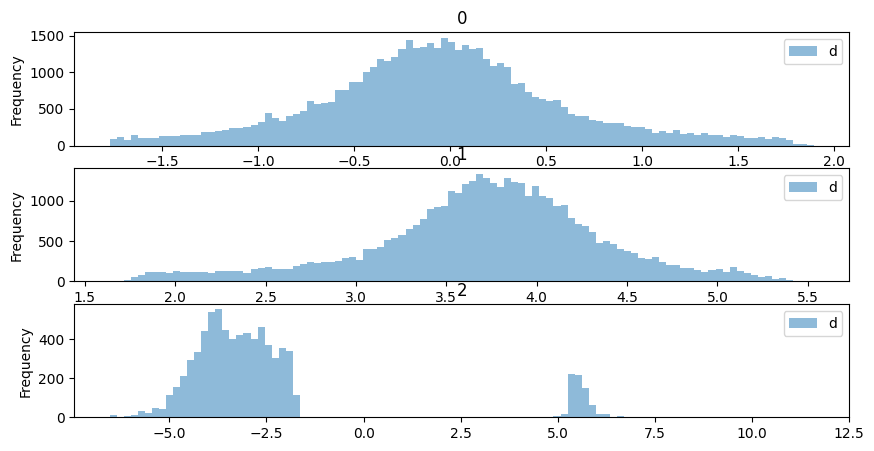

In [17]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

res.filter(pl.col("lane").str.contains("E"))[["d", "lane_index"]].sample(
    100_000
).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")

ax.set_xlim(-5, 6)

In [18]:
joined_df = res.clone()  # filter(pl.col("lane_index") <= 1)

## Save the Kalman Filtered Trajectories

In [19]:
# (
#     joined_df
#     .pipe(
#         add_front_back_s,
#         use_nearest_length=True,
#     )
# )

In [20]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

save_df = (
    joined_df
    # .pipe(
    #     add_front_back_s,
    #     use_nearest_length=True,
    # )
    .select(
        [
            "epoch_time",
            "object_id",
            # # (pl.col("front_s") - pl.col('distanceToFront_s')).alias('centroid_s'),
            # (pl.col('front_s') + pl.col('distanceToFront_s')).alias("front_s"),
            # (pl.col('front_s') - pl.col('length_s')).alias("back_s"),
            # 'front_s',
            # 'back_s',
            pl.col("s").alias("centroid_s"),
            (pl.col("s") + pl.col("distanceToFront_s")).alias("front_s"),
            (pl.col("s") + pl.col("distanceToBack_s")).alias("back_s"),
            "s_velocity",
            "d",
            "d_velocity",
            "lane",
            "lane_index",
            "prediction",
            "missing_data",
        ]
    )
)


# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s", "d", "front_x", "front_y"),
    ("back_s", "d", "back_x", "back_y"),
    ("centroid_s", "d", "centroid_x", "centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    save_df = (
        save_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )


save_df.write_parquet(
    ROOT.joinpath("data", "october_kalman.parquet"),
)

## Merge the Trajectories


In [21]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

joined_df = (
    joined_df.lazy()
    .pipe(
        add_front_back_s, use_median_length=False, s_col="front_s" if USE_FRONT else "s"
    )
    .collect()
)


lf_df = (
    joined_df.lazy()
    .pipe(build_leader_follower_df, s_col="front_s" if USE_FRONT else "s")
    # only consider vehicles that are fairly close
    .filter(pl.col("s_gap") < 20)
    # don't keep matches that are both prediction
    .filter(~(pl.col("prediction") & pl.col("prediction_leader")))
    # .filter()
    # assumption that radar tracks perfectly
    .filter((pl.col("ip") != pl.col("ip_leader")) | (pl.col("s_velocity") > 3))
    # .filter(pl.col("s_velocity") > 5)
    .filter(pl.col("lane_index") <= 1)
    .collect()
)

function: add_front_back_s took: 0.00010800361633300781 seconds
function: lazy_func took: 0.0010187625885009766 seconds


### Calculate the Association Log-Likelihood Distance


In [22]:
from src.pipelines.association import calc_assoc_liklihood_distance

lf_df = lf_df.pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=2)

function: lazy_func took: 0.6333625316619873 seconds


### Calculate the Match Indexes


In [23]:
from scipy.stats import chi
from src.pipelines.association import (
    calculate_match_indexes,
    pipe_gate_headway_calc,
    build_match_df,
    filter_bad_lane_matches,
)

assoc1_df = (
    lf_df.pipe(calculate_match_indexes, match_time_threshold=10)
    .pipe(pipe_gate_headway_calc, alpha=0.9)
    .pipe(
        filter_bad_lane_matches,
        traj_df=(
            joined_df.lazy()
            .with_columns(
                pl.col("object_id").cum_count().over("object_id").alias("count"),
                pl.count().over("object_id").alias("total_count"),
            )
            .filter(
                (pl.col("mu_CALC") < 0.1)
                & (
                    pl.col("count").is_between(
                        10,  # first 1 secon
                        pl.col("total_count") - prediction_length * 10 , # last 3 seconds (prediction)
                    )
                )
            )
            # .collect()
        ),
    )
    .collect()
)

match_df = (
    assoc1_df.lazy()
    .pipe(
        build_match_df,
        traj_time_df=joined_df.group_by("object_id")
        .agg(
            pl.col("epoch_time").max().alias("epoch_time_max"),
        )
        .lazy(),
        assoc_cutoff=chi.ppf(0.99, 2),
        assoc_cutoff_pred=chi.ppf(0.99, 2),
    )
    .collect()
)


# 1 - 0.99

function: lazy_func took: 0.0010695457458496094 seconds
function: lazy_func took: 0.00010633468627929688 seconds
function: filter_bad_lane_matches took: 0.6301140785217285 seconds
function: lazy_func took: 0.060729265213012695 seconds


In [24]:
chi.ppf(0.99, 4)

3.6437211935036444

In [25]:
# this is stupid
if "assoc_df" in globals():
    objs = assoc_df.filter(pl.col("vehicle_id").is_in([2464, 3838]))[
        "object_id"
    ]  # noqa: F821

    lf_df.filter(pl.col("object_id").is_in(objs) | pl.col("leader").is_in(objs)).filter(
        pl.col('epoch_time').dt.second() == 51
    )['association_distance'].ewm_mean(alpha=0.9).head()

### Re-Label the Joined Trajectories


In [26]:
from src.pipelines.association import create_vehicle_ids

assoc_df = joined_df.pipe(
    create_vehicle_ids,
    match_df,
)

function: lazy_func took: 0.5830235481262207 seconds


In [27]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 11:48:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 11:58:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("W"))
        & (pl.col("lane_index") == 1)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="s",
    markers=True,
    fig=fig,
    every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.00040793418884277344 seconds


In [28]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 12:09:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 12:13:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="front_s",
    markers=True,
    fig=fig,
    every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.0005364418029785156 seconds


In [29]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 12:03:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 12:05:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="front_s",
    markers=True,
    fig=fig,
    every=1,
)

# plot_time_space(
#     plot_df.filter(
#         pl.col('vehicle_id').is_in([6105, 1435])
#     ),
#     hoverdata="object_id",
#     vehicle_col="vehicle_id",
#     s_col="front_s",
#     color_func=lambda *_: "black",
#     markers=True,
#     fig=fig,
#     every=1,

# )

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.000499725341796875 seconds


In [30]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     joined_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:09:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:12:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (~pl.col("prediction"))
#         # & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

## Fuse & Smooth the Trajectories


In [31]:
from src.pipelines.association import build_fusion_df

fusion_df = (
    assoc_df.pipe(build_fusion_df, prediction_length=3, max_vehicle_num=3)
    .collect(streaming=True)
    .pipe(
        radar_obj.add_cst_timezone,
        time_col="epoch_time",
    )
)
# fusion_df.head()

function: lazy_func took: 2.4416167736053467 seconds
function: add_cst_timezone took: 0.00035834312438964844 seconds


In [32]:
# fusion_df.group_by(["vehicle_id", "time_index"]).agg(
#     pl.col("back_s").diff(),
#     pl.col("front_s").diff(),
#     pl.col("s").diff(),
# ).explode(["back_s", "front_s", "s"]).filter(pl.col("back_s").is_not_null())

In [33]:
distance_adjuster = (
    fusion_df.group_by(
        [
            "vehicle_id",
            "time_index",
        ]
    )
    .agg(
        pl.col("distanceToFront_s")
        .filter(pl.col("approaching"))
        .mean()
        .alias("distanceToFront_s"),
        pl.col("distanceToBack_s")
        .filter(~pl.col("approaching"))
        .mean()
        .alias("distanceToBack_s"),
        pl.col("distanceToFront_s").mean().alias("distanceToFront_s_all"),
        pl.col("distanceToBack_s").mean().alias("distanceToBack_s_all"),
    )
    .with_columns(
        pl.when(pl.col("distanceToFront_s").is_null())
        .then(pl.col("distanceToFront_s_all"))
        .otherwise(pl.col("distanceToFront_s"))
        .alias("distanceToFront_s"),
        pl.when(pl.col("distanceToBack_s").is_null())
        .then(pl.col("distanceToBack_s_all"))
        .otherwise(pl.col("distanceToBack_s"))
        .alias("distanceToBack_s"),
    )
    .drop(["distanceToFront_s_all", "distanceToBack_s_all"])
)

In [34]:
outer_df = (
    fusion_df.select(
        [
            "front_s",
            "s",
            "back_s",
            "s_velocity",
            "d",
            "d_velocity",
            "P",
            "vehicle_id",
            "time_index",
            "vehicle_time_index_int",
            "prediction",
            "length_s",
        ]
    )
    .lazy()
    .filter(~pl.col("prediction"))
)

outer_df = (
    (
        outer_df.join(
            outer_df,
            on=["time_index", "vehicle_id"],
            how="outer",
            suffix="_leader",
        )
    )
    .with_columns(
        pl.struct(
            [
                pl.min_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("one"),
                pl.max_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("two"),
            ]
        ).alias("vehicle_time_struct"),
    )
    # .collect()
    .filter(
        (
            pl.col("vehicle_time_index_int")
            .cum_count()
            .over(["vehicle_id", "time_index", "vehicle_time_struct"])
            < 1
        )
        & (pl.col("vehicle_time_index_int") != pl.col("vehicle_time_index_int_leader"))
    )
    .collect(streaming=True)
    .pipe(
        calc_assoc_liklihood_distance,
        gpu=GPU,
        dims=4,
    )
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("association_distance").max())
)

function: lazy_func took: 0.3374040126800537 seconds


In [35]:
prediction_tracker = (
    fusion_df.select(
        [
            "vehicle_id",
            "time_index",
            # "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("prediction").all().alias("prediction"))
    .collect()
)

In [36]:
from src.filters.fusion import batch_join, rts_smooth

GPU = True

# errrrrr

# v = fusion_df["P"].to_numpy(writable=True)
# v[:, 0] += fusion_df["length_s"].to_numpy() / 4

# fusion_df = fusion_df.with_columns(
#     P=v,
# ).with_columns(pl.col("P").list.to_array(width=36))

merged_df = batch_join(
    fusion_df,
    method="ImprovedFastCI",
    batch_size=10_000 if not GPU else 10_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)
merged_df = rts_smooth(
    merged_df,
    batch_size=10_000 if not GPU else 50_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)

merged_df = (
    merged_df.lazy()
    .join(
        fusion_df.lazy()
        .select(["time_index", "vehicle_id", "object_id", "length_s"])
        .group_by(["time_index", "vehicle_id"])
        .agg(pl.col("object_id"), pl.col("length_s").mean()),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        outer_df.lazy().select(["time_index", "vehicle_id", "association_distance"]),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        distance_adjuster.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .join(
        prediction_tracker.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .with_columns(
        (pl.col("ci_s") + pl.col("distanceToFront_s")).alias("ci_front_s"),
        (pl.col("ci_s") + pl.col("distanceToBack_s")).alias("ci_back_s"),
        (pl.col("s_smooth") + pl.col("distanceToFront_s")).alias("front_s_smooth"),
        (pl.col("s_smooth") + pl.col("distanceToBack_s")).alias("back_s_smooth"),
    )
    .collect()
)

100%|██████████| 1396/1396 [00:11<00:00, 125.67it/s]
/home/max/Development/roadside-radar/src/filters/fusion.py:918: UserWarning:

The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)

100%|██████████| 1396/1396 [00:04<00:00, 348.20it/s]


In [37]:
# merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone).head()

In [38]:
from src.plotting.single_veh import plot_vehicle

# 2370	22	2.326786	0.303536	"1"
# 1227	22	6.57618	1.667884	"1"
# 1209
vehs = [
    440
    # 4766,
    # 19033,
    # 4791
    # 3845
    # 101,
    # 1098,
]

fig = None

for veh in vehs:
    ind_vehicles = (
        fusion_df.filter(pl.col("vehicle_id") == veh)["object_id"].unique().to_list()
    )

    fig = plot_vehicle(
        fusion_df.filter(pl.col("vehicle_id") == veh),
        s_velocity_col="s_velocity",
        s_col="front_s",
        fig=fig,
        data_name="IMM Filtered",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="s_smooth",
        s_velocity_col="s_velocity_smooth",
        # s_velocity_col="ci_s_velocity",
        d_col="d_smooth",
        d_velocity_col="d_velocity_smooth",
        fig=fig,
        color="blue",
        data_name="Fused and Smoothed",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="ci_s",
        s_velocity_col="ci_s_velocity",
        # s_velocity_col="ci_s_velocity",
        d_col="ci_d",
        d_velocity_col="ci_d_velocity",
        fig=fig,
        color="purple",
        data_name="CI Fused",
    )

    plot_vehicle(
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        ).pipe(
            radar_obj.add_cst_timezone,
        ),
        # s_col="front_s",
        # s_velocity_col="s_velocity",
        d_col="d",
        # d_velocity_col="d_velocity",
        fig=fig,
        color="black",
        data_name="Radar Raw",
    )


fig.update_layout(
    # use journal paper font
    font_family="Times New Roman",
    # set the font size
    font_size=22,
    # update the subplot titles
    title_font_family="Times New Roman",
    title_font_size=44,
    # set the x_limit
    yaxis=dict(
        title="S Distance [m]",
    ),
    yaxis2=dict(
        title="S Velocity [m/s]",
    ),
    yaxis3=dict(
        title="D Distance [m/s]",
    ),
    yaxis4=dict(
        title="D Velocity [m/s]",
    ),
    # set the size of the figure
    width=1000,
    height=600,
    template="ggplot2",
    # set the margin to reduce the whitespace
    margin=dict(l=0, r=0, t=0, b=0),
    # put the legend on the bottom
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(
            # family="Times New Roman",
            size=22,
        ),
    ),
)

function: add_cst_timezone took: 0.0001678466796875 seconds
function: add_cst_timezone took: 0.00010752677917480469 seconds
function: add_cst_timezone took: 0.00017189979553222656 seconds


## Save the File

In [43]:
from src.filters.vectorized_kalman import CALCFilter

print(CALCFilter.w_s)

8


In [40]:
# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s_smooth", "d_smooth", "front_x_smooth", "front_y_smooth"),
    ("back_s_smooth", "d_smooth", "back_x_smooth", "back_y_smooth"),
    ("s_smooth", "d_smooth", "centroid_x_smooth", "centroid_y_smooth"),
    ("ci_front_s", "ci_d", "ci_front_x", "ci_front_y"),
    ("ci_back_s", "ci_d", "ci_back_x", "ci_back_y"),
    ("ci_s", "ci_d", "ci_centroid_x", "ci_centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    merged_df = (
        merged_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )

In [41]:
merged_df.drop(*[c for c in merged_df.columns if ("_int" in c)], "ci_P").write_parquet(
    ROOT / "data" / "merged_october.parquet",
    use_pyarrow=True,
    compression="zstd",
    compression_level=15,
)

In [42]:
merged_df.filter(pl.col("vehicle_id").is_in([4298, 4313])).drop(
    *[c for c in merged_df.columns if ("_int" in c)], "ci_P"
).write_parquet(
    ROOT / "data" / "traj_samples.parquet",
)